### Simplifying Performance Regression



Importing the necessary libraries and data 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib as plt

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Read in the dataset

In [ ]:
df = pd.read_csv (r'DataSetCuratedExtended2020.csv')
df.head(2)

,Commit A,Commit B,Benchmark,Del Func >= X,New Func >= X,Reached Del Func >= X,Top Chg by Call >= X%,Top > X% by Call Chg by >= 10%,Top Chg by Instr >= X%,Top Chg Len >= X%,Top Reached Chg Len >= X%,AltCountLineBlank,AltCountLineCode,AltCountLineComment,CountLine,CountLineBlank,CountLineCode,CountLineCodeDecl,CountLineCodeExe,CountLineComment,CountLineInactive,CountLinePreprocessor,CountSemicolon,CountStmt,CountStmtDecl,CountStmtEmpty,CountStmtExe,SumCyclomatic,SumCyclomaticModified,SumCyclomaticStrict,SumEssential,MaxCyclomatic,MaxCyclomaticModified,MaxCyclomaticStrict,MaxNesting,AltAvgLineBlank,AltAvgLineCode,AltAvgLineComment,AvgCyclomatic,AvgCyclomaticModified,AvgCyclomaticStrict,AvgEssential,AvgLine,AvgLineBlank,AvgLineCode,AvgLineComment,Cyclomatic,CyclomaticModified,CyclomaticStrict,Hit/Dismiss
0,d9545c7f,8f449614,p0000-perf-lib-sanity.sh-perf-report,983,515,7,0.07,0.03,False,1.0,1.0,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.02322,-0.019545,-0.048357,-0.02795,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
1,d9545c7f,8f449614,p0001-rev-list.sh-perf-report,983,515,16,12.49,3.20,False,1.0,1.0,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.02322,-0.019545,-0.048357,-0.02795,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0


In [ ]:
df.dtypes

Commit A                           object
Commit B                           object
Benchmark                          object
Del Func >= X                       int64
New Func >= X                       int64
Reached Del Func >= X               int64
Top Chg by Call >= X%             float64
Top > X% by Call Chg by >= 10%    float64
Top Chg by Instr >= X%               bool
Top Chg Len >= X%                 float64
Top Reached Chg Len >= X%         float64
AltCountLineBlank                   int64
AltCountLineCode                    int64
AltCountLineComment                 int64
CountLine                           int64
CountLineBlank                      int64
CountLineCode                       int64
CountLineCodeDecl                   int64
CountLineCodeExe                    int64
CountLineComment                    int64
CountLineInactive                   int64
CountLinePreprocessor               int64
CountSemicolon                      int64
CountStmt                         

### Data Preprocessing

Understand the target variable

In [ ]:
counts = df.groupby('Hit/Dismiss')['Hit/Dismiss'].count()
print(counts)

total = df['Hit/Dismiss'].count()
print (total)

returned = df['Hit/Dismiss'].sum()
print (returned)

percent = returned/total
print(percent)


Hit/Dismiss
0    5982
1     401
Name: Hit/Dismiss, dtype: int64
6383
401
0.06282312392292026


6.28% are performance regression commits. Small amount -  this causes class imbalance

In [ ]:
df2 = df.dropna()

Dropped NAs (only 1 record)

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6382 entries, 0 to 6382
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Commit A                        6382 non-null   object 
 1   Commit B                        6382 non-null   object 
 2   Benchmark                       6382 non-null   object 
 3   Del Func >= X                   6382 non-null   int64  
 4   New Func >= X                   6382 non-null   int64  
 5   Reached Del Func >= X           6382 non-null   int64  
 6   Top Chg by Call >= X%           6382 non-null   float64
 7   Top > X% by Call Chg by >= 10%  6382 non-null   float64
 8   Top Chg by Instr >= X%          6382 non-null   bool   
 9   Top Chg Len >= X%               6382 non-null   float64
 10  Top Reached Chg Len >= X%       6382 non-null   float64
 11  AltCountLineBlank               6382 non-null   int64  
 12  AltCountLineCode                63

Preprocessing packages to encode all objects. This enables us to perform machine learning

In [ ]:
from sklearn import preprocessing

In [ ]:
le = preprocessing.LabelEncoder()

for i in range(0,df2.shape[1]):
    if df2.dtypes[i]=='object':
        df2[df.columns[i]] = le.fit_transform(df2[df2.columns[i]].astype(str))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [ ]:
df2.head(2)

,Commit A,Commit B,Benchmark,Del Func >= X,New Func >= X,Reached Del Func >= X,Top Chg by Call >= X%,Top > X% by Call Chg by >= 10%,Top Chg by Instr >= X%,Top Chg Len >= X%,Top Reached Chg Len >= X%,AltCountLineBlank,AltCountLineCode,AltCountLineComment,CountLine,CountLineBlank,CountLineCode,CountLineCodeDecl,CountLineCodeExe,CountLineComment,CountLineInactive,CountLinePreprocessor,CountSemicolon,CountStmt,CountStmtDecl,CountStmtEmpty,CountStmtExe,SumCyclomatic,SumCyclomaticModified,SumCyclomaticStrict,SumEssential,MaxCyclomatic,MaxCyclomaticModified,MaxCyclomaticStrict,MaxNesting,AltAvgLineBlank,AltAvgLineCode,AltAvgLineComment,AvgCyclomatic,AvgCyclomaticModified,AvgCyclomaticStrict,AvgEssential,AvgLine,AvgLineBlank,AvgLineCode,AvgLineComment,Cyclomatic,CyclomaticModified,CyclomaticStrict,Hit/Dismiss
0,609,402,0,983,515,7,0.07,0.03,False,1.0,1.0,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.02322,-0.019545,-0.048357,-0.02795,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
1,609,402,1,983,515,16,12.49,3.20,False,1.0,1.0,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.02322,-0.019545,-0.048357,-0.02795,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0


In [ ]:
df2.dtypes

Commit A                            int64
Commit B                            int64
Benchmark                           int64
Del Func >= X                       int64
New Func >= X                       int64
Reached Del Func >= X               int64
Top Chg by Call >= X%             float64
Top > X% by Call Chg by >= 10%    float64
Top Chg by Instr >= X%               bool
Top Chg Len >= X%                 float64
Top Reached Chg Len >= X%         float64
AltCountLineBlank                   int64
AltCountLineCode                    int64
AltCountLineComment                 int64
CountLine                           int64
CountLineBlank                      int64
CountLineCode                       int64
CountLineCodeDecl                   int64
CountLineCodeExe                    int64
CountLineComment                    int64
CountLineInactive                   int64
CountLinePreprocessor               int64
CountSemicolon                      int64
CountStmt                         

In [ ]:
counts = df2.groupby('Hit/Dismiss')['Hit/Dismiss'].count()
print(counts)

total = df2['Hit/Dismiss'].count()
print (total)

returned = df2['Hit/Dismiss'].sum()
print (returned)

percent = returned/total
print(percent)


Hit/Dismiss
0    5981
1     401
Name: Hit/Dismiss, dtype: int64
6382
401
0.06283296772171733


Use ensemble library to get a quick feature importance. 47 features is a lot, a few are shown to be not useful. 

[0.06731987 0.05929641 0.04690944 0.03708617 0.03855196 0.00893585
 0.01357024 0.01099202 0.         0.01863139 0.0154541  0.03429673
 0.0399916  0.04078087 0.03943175 0.03605452 0.03800284 0.03776007
 0.03829913 0.04081299 0.0306244  0.03137504 0.03734119 0.0351458
 0.03733875 0.03471159 0.03501869 0.03179475 0.03123832 0.03323351]


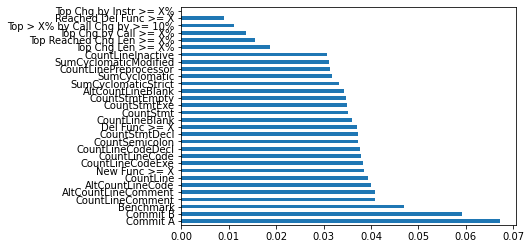

In [ ]:
X = df2.iloc[:,0:30]
y = df2.iloc[:,-1]    
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(50).plot(kind='barh')
plt.show()

Drop those features

In [ ]:
df2.drop(['Reached Del Func >= X',
'Top Chg by Call >= X%',
'Top > X% by Call Chg by >= 10%',
'Top Chg by Instr >= X%',
'Top Chg Len >= X%',
'Top Reached Chg Len >= X%',
],axis=1)

,Commit A,Commit B,Benchmark,Del Func >= X,New Func >= X,AltCountLineBlank,AltCountLineCode,AltCountLineComment,CountLine,CountLineBlank,CountLineCode,CountLineCodeDecl,CountLineCodeExe,CountLineComment,CountLineInactive,CountLinePreprocessor,CountSemicolon,CountStmt,CountStmtDecl,CountStmtEmpty,CountStmtExe,SumCyclomatic,SumCyclomaticModified,SumCyclomaticStrict,SumEssential,MaxCyclomatic,MaxCyclomaticModified,MaxCyclomaticStrict,MaxNesting,AltAvgLineBlank,AltAvgLineCode,AltAvgLineComment,AvgCyclomatic,AvgCyclomaticModified,AvgCyclomaticStrict,AvgEssential,AvgLine,AvgLineBlank,AvgLineCode,AvgLineComment,Cyclomatic,CyclomaticModified,CyclomaticStrict,Hit/Dismiss
0,609,402,0,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
1,609,402,1,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
2,609,402,2,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
3,609,402,9,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
4,609,402,10,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
5,609,402,11,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
6,609,402,12,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
7,609,402,14,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
8,609,402,16,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0
9,609,402,17,983,515,1855,9572,2807,14160,1845,8984,2480,6078,2768,168,506,4652,6548,1676,29,4843,2004,1935,2268,968,1,1,0,0,0.009604,0.002129,-0.038383,-0.025327,-0.023220,-0.019545,-0.048357,-0.027950,0.008181,-0.003676,-0.037834,-0.126343,-0.127949,-0.160791,0


Use preprocessing MinMaxScaler to get values between 0:1. Important for SVM. 

In [ ]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
features = ['Commit A',
'Commit B',
'Benchmark',
'Del Func >= X',
'New Func >= X',
'AltCountLineBlank',
'AltCountLineCode',
'AltCountLineComment',
'CountLine',
'CountLineBlank',
'CountLineCode',
'CountLineCodeDecl',
'CountLineCodeExe',
'CountLineComment',
'CountLineInactive',
'CountLinePreprocessor',
'CountSemicolon',
'CountStmt',
'CountStmtDecl',
'CountStmtEmpty',
'CountStmtExe',
'SumCyclomatic',
'SumCyclomaticModified',
'SumCyclomaticStrict',
'SumEssential',
'MaxCyclomatic',
'MaxCyclomaticModified',
'MaxCyclomaticStrict',
'MaxNesting',
'AltAvgLineBlank',
'AltAvgLineCode',
'AltAvgLineComment',
'AvgCyclomatic',
'AvgCyclomaticModified',
'AvgCyclomaticStrict',
'AvgEssential',
'AvgLine',
'AvgLineBlank',
'AvgLineCode',
'AvgLineComment',
'Cyclomatic',
'CyclomaticModified',
'CyclomaticStrict']
df2[features] = sc.fit_transform(df2[features])

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6382 entries, 0 to 6382
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Commit A                        6382 non-null   float64
 1   Commit B                        6382 non-null   float64
 2   Benchmark                       6382 non-null   float64
 3   Del Func >= X                   6382 non-null   float64
 4   New Func >= X                   6382 non-null   float64
 5   Reached Del Func >= X           6382 non-null   int64  
 6   Top Chg by Call >= X%           6382 non-null   float64
 7   Top > X% by Call Chg by >= 10%  6382 non-null   float64
 8   Top Chg by Instr >= X%          6382 non-null   bool   
 9   Top Chg Len >= X%               6382 non-null   float64
 10  Top Reached Chg Len >= X%       6382 non-null   float64
 11  AltCountLineBlank               6382 non-null   float64
 12  AltCountLineCode                63

In [ ]:
df2.head()

,Commit A,Commit B,Benchmark,Del Func >= X,New Func >= X,Reached Del Func >= X,Top Chg by Call >= X%,Top > X% by Call Chg by >= 10%,Top Chg by Instr >= X%,Top Chg Len >= X%,Top Reached Chg Len >= X%,AltCountLineBlank,AltCountLineCode,AltCountLineComment,CountLine,CountLineBlank,CountLineCode,CountLineCodeDecl,CountLineCodeExe,CountLineComment,CountLineInactive,CountLinePreprocessor,CountSemicolon,CountStmt,CountStmtDecl,CountStmtEmpty,CountStmtExe,SumCyclomatic,SumCyclomaticModified,SumCyclomaticStrict,SumEssential,MaxCyclomatic,MaxCyclomaticModified,MaxCyclomaticStrict,MaxNesting,AltAvgLineBlank,AltAvgLineCode,AltAvgLineComment,AvgCyclomatic,AvgCyclomaticModified,AvgCyclomaticStrict,AvgEssential,AvgLine,AvgLineBlank,AvgLineCode,AvgLineComment,Cyclomatic,CyclomaticModified,CyclomaticStrict,Hit/Dismiss
0,0.857746,0.565401,0.000000,0.145673,0.220462,7,0.07,0.03,False,1.0,1.0000,0.20585,0.17817,0.239788,0.19112,0.207773,0.181402,0.195286,0.178638,0.244825,0.135692,0.205391,0.176788,0.177186,0.179048,0.37827,0.175886,0.177924,0.177116,0.172805,0.175584,0.745652,0.7277,0.723519,0.0,0.135865,0.168848,0.171777,0.174757,0.174895,0.185366,0.211504,0.16598,0.137224,0.173051,0.175242,0.215094,0.21377,0.215081,0
1,0.857746,0.565401,0.055556,0.145673,0.220462,16,12.49,3.20,False,1.0,1.0000,0.20585,0.17817,0.239788,0.19112,0.207773,0.181402,0.195286,0.178638,0.244825,0.135692,0.205391,0.176788,0.177186,0.179048,0.37827,0.175886,0.177924,0.177116,0.172805,0.175584,0.745652,0.7277,0.723519,0.0,0.135865,0.168848,0.171777,0.174757,0.174895,0.185366,0.211504,0.16598,0.137224,0.173051,0.175242,0.215094,0.21377,0.215081,0
2,0.857746,0.565401,0.111111,0.145673,0.220462,0,0.00,0.00,False,1.0,0.3125,0.20585,0.17817,0.239788,0.19112,0.207773,0.181402,0.195286,0.178638,0.244825,0.135692,0.205391,0.176788,0.177186,0.179048,0.37827,0.175886,0.177924,0.177116,0.172805,0.175584,0.745652,0.7277,0.723519,0.0,0.135865,0.168848,0.171777,0.174757,0.174895,0.185366,0.211504,0.16598,0.137224,0.173051,0.175242,0.215094,0.21377,0.215081,0
3,0.857746,0.565401,0.500000,0.145673,0.220462,14,0.22,0.14,False,1.0,1.0000,0.20585,0.17817,0.239788,0.19112,0.207773,0.181402,0.195286,0.178638,0.244825,0.135692,0.205391,0.176788,0.177186,0.179048,0.37827,0.175886,0.177924,0.177116,0.172805,0.175584,0.745652,0.7277,0.723519,0.0,0.135865,0.168848,0.171777,0.174757,0.174895,0.185366,0.211504,0.16598,0.137224,0.173051,0.175242,0.215094,0.21377,0.215081,0
4,0.857746,0.565401,0.555556,0.145673,0.220462,3,0.04,0.04,False,1.0,1.0000,0.20585,0.17817,0.239788,0.19112,0.207773,0.181402,0.195286,0.178638,0.244825,0.135692,0.205391,0.176788,0.177186,0.179048,0.37827,0.175886,0.177924,0.177116,0.172805,0.175584,0.745652,0.7277,0.723519,0.0,0.135865,0.168848,0.171777,0.174757,0.174895,0.185366,0.211504,0.16598,0.137224,0.173051,0.175242,0.215094,0.21377,0.215081,0


###Model Development

Modeling begins. Import packages and start with logistic regression classifier.

#### **Logistic Regression**

#####importing required libraries

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score, balanced_accuracy_score

##### Logistic Regression Baseline

In [ ]:
X  = df2.loc[ : , df2.columns != 'Hit/Dismiss']
y = df2['Hit/Dismiss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=0)

In [ ]:
#baseline
LR1 = LogisticRegression(random_state =1)
LR1.fit(X_train, y_train)
score = LR1.score(X_test, y_test)
print("Accuracy:", score)
y_predicted = LR1.predict(X_test)
print("Mean squared error: %.3f" % mean_squared_error(y_test, y_predicted))
print('R²: %.3f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


Accuracy: 0.9381120250685469
Mean squared error: 0.062
R²: -0.066
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      4790

   micro avg       0.94      1.00      0.97      4790
   macro avg       0.94      1.00      0.97      4790
weighted avg       0.94      1.00      0.97      4790

BCR: 0.5


In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


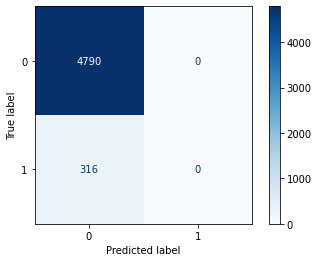

(0.0, 1.0)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(LR1, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Logistic regression using SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=3)

In [ ]:
sm= SMOTE()
X_train_sm,y_train_sm = sm.fit_resample(X_train, y_train)

In [ ]:
#SMOTE
LR2 = LogisticRegression(random_state =4)
LR2.fit(X_train_sm, y_train_sm)
score = LR2.score(X_test, y_test)
print("Accuracy:", score)
y_predicted = LR2.predict(X_test)
print("Mean squared error: %.3f" % mean_squared_error(y_test, y_predicted))
print('R²: %.3f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.6218174696435566
Mean squared error: 0.378
R²: -5.533
              precision    recall  f1-score   support

           0       0.95      0.63      0.76      4791
           1       0.09      0.54      0.15       315

    accuracy                           0.62      5106
   macro avg       0.52      0.58      0.45      5106
weighted avg       0.90      0.62      0.72      5106

BCR: 0.5849330590094522


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


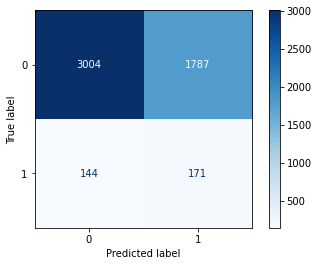

(0.5428571428571428, 0.6270089751617617)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(LR2, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Logistic Regression RUS

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=5)
rus= RandomUnderSampler()
X_train_rus,y_train_rus = rus.fit_resample(X_train, y_train)

In [ ]:
#RUS
LR3 = LogisticRegression(random_state =6)
LR3.fit(X_train_rus, y_train_rus)
score = LR3.score(X_test, y_test)
print("Accuracy:", score)
y_predicted = LR3.predict(X_test)
print("Mean squared error: %.3f" % mean_squared_error(y_test, y_predicted))
print('R²: %.3f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.6069330199764983
Mean squared error: 0.393
R²: -5.595
              precision    recall  f1-score   support

           0       0.96      0.61      0.74      4781
           1       0.09      0.61      0.16       325

    accuracy                           0.61      5106
   macro avg       0.53      0.61      0.45      5106
weighted avg       0.90      0.61      0.71      5106

BCR: 0.6065699161746014


plotting the confusion matrix

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


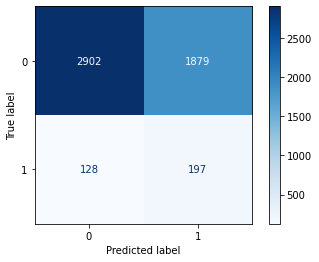

(0.6061538461538462, 0.6069859861953566)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(LR3, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Logistic Regression ROS

In [ ]:
from imblearn.over_sampling import RandomOverSampler

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=7)
rus= RandomUnderSampler()
X_train_ros,y_train_ros = rus.fit_resample(X_train, y_train)

In [ ]:
#ROS
LR4 = LogisticRegression(random_state =8)
LR4.fit(X_train_ros, y_train_ros)
score = LR4.score(X_test, y_test)
print("Accuracy:", score)
y_predicted = LR4.predict(X_test)
print("Mean squared error: %.3f" % mean_squared_error(y_test, y_predicted))
print('R²: %.3f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.5771641206423815
Mean squared error: 0.423
R²: -6.095
              precision    recall  f1-score   support

           0       0.96      0.57      0.72      4781
           1       0.10      0.66      0.17       325

    accuracy                           0.58      5106
   macro avg       0.53      0.62      0.44      5106
weighted avg       0.91      0.58      0.68      5106

BCR: 0.6179173973903109


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


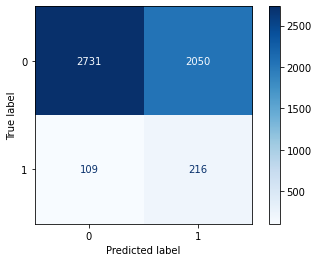

(0.6646153846153846, 0.5712194101652374)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(LR4, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#### **Random Forest Classifier**

#####Random forest classifier baseline

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=9)


In [ ]:
#baseline
RFC = RandomForestClassifier(criterion="entropy")
RFC = RFC.fit(X_train,y_train)
y_predicted = RFC.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.9441833137485312
Mean Squared Error: 0.05581668625146886
R²: 0.03
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      4793
           1       0.71      0.15      0.25       313

    accuracy                           0.94      5106
   macro avg       0.83      0.57      0.61      5106
weighted avg       0.93      0.94      0.93      5106

BCR: 0.5730978150377715


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


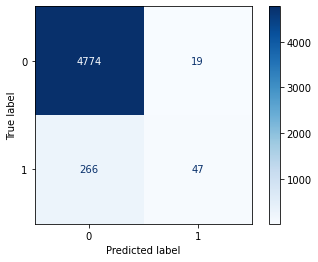

(0.1501597444089457, 0.9960358856665972)

In [ ]:
plot_confusion_matrix(RFC, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Random forest classifier SMOTE

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=10)
sm= SMOTE()
X_train_sm,y_train_sm = sm.fit_resample(X_train, y_train)

In [ ]:
#smote
RFC2 = RandomForestClassifier(criterion="entropy")
RFC2 = RFC2.fit(X_train_sm,y_train_sm)
y_predicted = RFC2.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.9465334900117509
Mean Squared Error: 0.05346650998824912
R²: 0.10
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      4781
           1       0.72      0.26      0.38       325

    accuracy                           0.95      5106
   macro avg       0.84      0.63      0.68      5106
weighted avg       0.94      0.95      0.93      5106

BCR: 0.6258841890174247


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


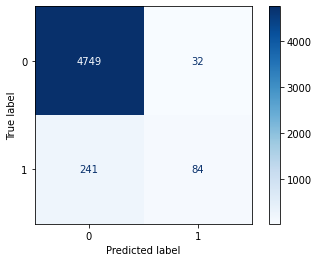

(0.25846153846153846, 0.993306839573311)

In [ ]:
plot_confusion_matrix(RFC2, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Random Forest Classifier RUS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=11)
rus= RandomUnderSampler()
X_train_rus,y_train_rus = rus.fit_resample(X_train, y_train)

In [ ]:
#rus
RFC3 = RandomForestClassifier(criterion="entropy")
RFC3 = RFC3.fit(X_train_rus,y_train_rus)
y_predicted = RFC3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.6372894633764199
Mean Squared Error: 0.3627105366235801
R²: -5.05
              precision    recall  f1-score   support

           0       0.98      0.63      0.76      4779
           1       0.13      0.78      0.22       327

    accuracy                           0.64      5106
   macro avg       0.55      0.70      0.49      5106
weighted avg       0.92      0.64      0.73      5106

BCR: 0.7036768277114517


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


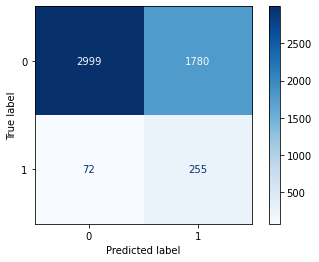

(0.7798165137614679, 0.6275371416614355)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(RFC3, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Random Forest ROS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=12)
ros= RandomOverSampler()
X_train_ros,y_train_ros = ros.fit_resample(X_train, y_train)

In [ ]:
#ros
RFC4 = RandomForestClassifier(criterion="entropy")
RFC4 = RFC4.fit(X_train_ros,y_train_ros)
y_predicted = RFC4.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.9524089306698003
Mean Squared Error: 0.04759106933019976
R²: 0.17
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4795
           1       0.80      0.29      0.43       311

    accuracy                           0.95      5106
   macro avg       0.88      0.64      0.70      5106
weighted avg       0.95      0.95      0.94      5106

BCR: 0.642400477453403


In [ ]:
results_dict = {"Classifier": "",
                "Resampling Technique": "",
		            "Stratified K Fold": "",
		            "FS:HC-SROC": "Yes/No",
		            "Accuracy": "",
		            "Precision": "",
		            "Recall": "",
		            "F1-Score": "",
		            "Specificity": "",
		            "BCR": ""}

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


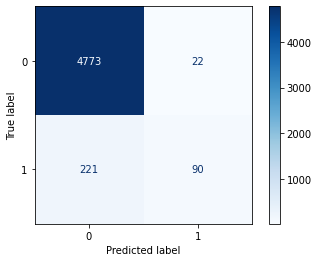

(0.28938906752411575, 0.9954118873826903)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(RFC4, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

In [ ]:
df2.reset_index(drop=True, inplace=True)

In [ ]:
X  = df2.loc[ : , df2.columns != 'Hit/Dismiss']
y = df2['Hit/Dismiss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=46)

#### **Random Forest Classifier with StratifiedKFold**


In [ ]:
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=5,shuffle=True, random_state=58)
for train_index, test_index in skf.split(X, y):
    X_train_fold, X_test_fold = X.loc[train_index], X.loc[test_index]
    y_train_fold, y_test_fold = y.loc[train_index], y.loc[test_index]

#####Random Forest Classifier for the baseline

In [ ]:
RFC5 = RandomForestClassifier(criterion="entropy")
RFC5 = RFC5.fit(X_train_fold,y_train_fold)
y_predicted = RFC5.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.963166144200627
Mean Squared Error: 0.03683385579937304
R²: 0.37
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1196
           1       0.95      0.44      0.60        80

    accuracy                           0.96      1276
   macro avg       0.95      0.72      0.79      1276
weighted avg       0.96      0.96      0.96      1276

BCR: 0.7179138795986622


Capturing the results in a dataframe for visualization
<br>FS:HC-SROC stands for ***Feature Selection: Hierarchial Clustering using Spearman rank-order correlations***

In [ ]:
rc5_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "Baseline",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "No",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = pd.DataFrame(rc5_results_dict,index=[0])

Confusion Matrix for the RFC with baseline

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


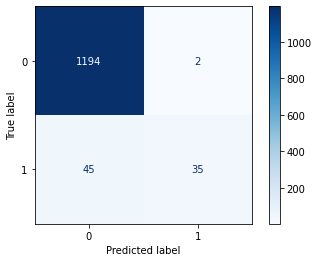

(0.4375, 0.9983277591973244)

In [ ]:
plot_confusion_matrix(RFC5, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Random Forest Classifier with StratifiedKFolds using SMOTE

In [ ]:
sm= SMOTE()
X_train_sm_fold,y_train_sm_fold = sm.fit_resample(X_train_fold, y_train_fold)

In [ ]:
RFC6 = RandomForestClassifier(criterion="entropy")
RFC6 = RFC6.fit(X_train_sm_fold,y_train_sm_fold)
y_predicted = RFC6.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.9772727272727273
Mean Squared Error: 0.022727272727272728
R²: 0.61
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1196
           1       0.96      0.66      0.79        80

    accuracy                           0.98      1276
   macro avg       0.97      0.83      0.89      1276
weighted avg       0.98      0.98      0.98      1276

BCR: 0.8304138795986622


Capturing the results in a dataframe for visualization

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


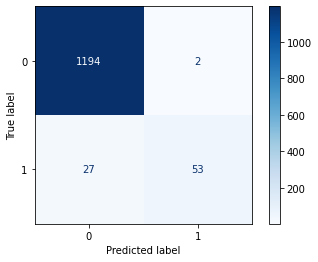

(0.6625, 0.9983277591973244)

In [ ]:
plot_confusion_matrix(RFC6, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

In [ ]:
rc6_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "SMOTE",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "No",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc6_results_dict,ignore_index=True)

#####Random Forest Classifier with StratifiedKFolds using RandomUnderSampler

In [ ]:
rus= RandomUnderSampler()
X_train_rus_fold,y_train_rus_fold = rus.fit_resample(X_train_fold, y_train_fold)

In [ ]:
RFC7 = RandomForestClassifier(criterion="entropy")
RFC7 = RFC7.fit(X_train_rus_fold,y_train_rus_fold)
y_predicted = RFC7.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.7860501567398119
Mean Squared Error: 0.2139498432601881
R²: -2.64
              precision    recall  f1-score   support

           0       0.99      0.78      0.87      1196
           1       0.21      0.89      0.34        80

    accuracy                           0.79      1276
   macro avg       0.60      0.83      0.61      1276
weighted avg       0.94      0.79      0.84      1276

BCR: 0.8333821070234113


In [ ]:
rc7_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "RUS",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "No",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc7_results_dict,ignore_index=True)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


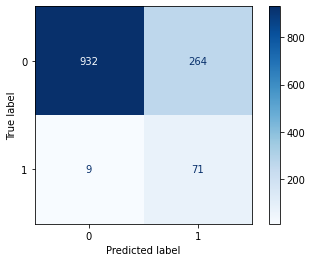

(0.8875, 0.7792642140468228)

In [ ]:
plot_confusion_matrix(RFC7, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Random Forest Classifier with StratifiedKFolds using RandomOverSampler

In [ ]:
ros= RandomOverSampler()
X_train_ros_fold,y_train_ros_fold = ros.fit_resample(X_train_fold, y_train_fold)

In [ ]:
RFC8 = RandomForestClassifier(criterion="entropy")
RFC8 = RFC8.fit(X_train_ros_fold,y_train_ros_fold)
y_predicted = RFC8.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.9670846394984326
Mean Squared Error: 0.032915360501567396
R²: 0.44
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1196
           1       0.91      0.53      0.67        80

    accuracy                           0.97      1276
   macro avg       0.94      0.76      0.82      1276
weighted avg       0.97      0.97      0.96      1276

BCR: 0.7608277591973245


In [ ]:
rc8_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "ROS",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "No",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc8_results_dict,ignore_index=True)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


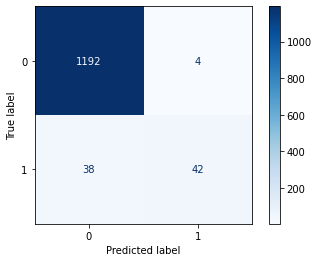

(0.525, 0.9966555183946488)

In [ ]:
plot_confusion_matrix(RFC8, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#### **Random Forest Classfier using Permutaion Importance**

Next, we plot the tree based feature importance and the permutation importance.<br>The permutation importance is calculated on the training set to show how much the model relies on each feature during training.

#####Selecting Features

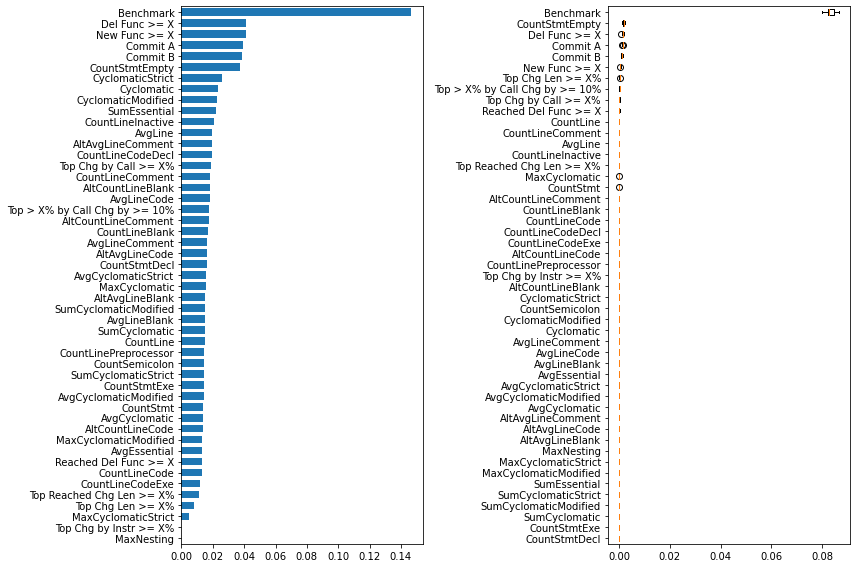

In [ ]:
from sklearn.inspection import permutation_importance

#X_train_sm_fold,y_train_sm_fold = sm.fit_resample(X_train_fold, y_train_fold)
clf = RFC6

result = permutation_importance(clf, X_train_sm_fold, y_train_sm_fold, n_repeats=10, random_state=42)

perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
ax1.barh(tree_indices, clf.feature_importances_[tree_importance_sorted_idx], height=0.7)
ax1.set_yticks(tree_indices)
ax1.set_yticklabels(X_train_sm_fold.columns[tree_importance_sorted_idx])
ax1.set_ylim((0, len(clf.feature_importances_)))
ax2.boxplot(
    result.importances[perm_sorted_idx].T,
    vert=False,
    labels=X_train_sm_fold.columns[perm_sorted_idx],
)
fig.tight_layout()
plt.show()

When features are collinear, permutating one feature will have little effect on the models performance because it can get the same information from a correlated feature. One way to handle multicollinear features is by performing hierarchical clustering on the Spearman rank-order correlations, picking a threshold, and keeping a single feature from each cluster. <br>First, we plot a dendogram and the heatmap of the correlated features:

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


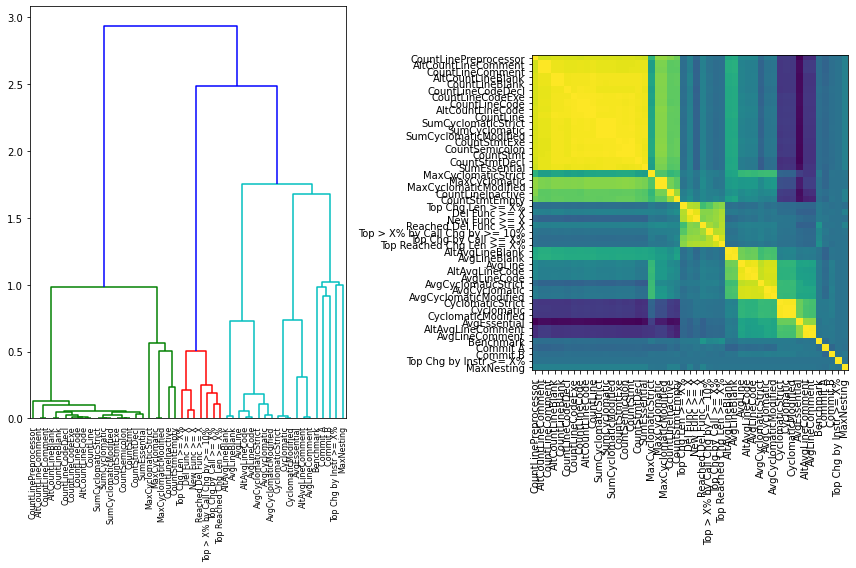

In [ ]:
import numpy as np
from scipy.stats import spearmanr
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
corr = spearmanr(X_train_sm_fold).correlation

# Ensure the correlation matrix is symmetric
corr = (corr + corr.T) / 2
corr = np.nan_to_num(corr)
np.fill_diagonal(corr, 1)

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - np.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=X_train_sm_fold.columns, ax=ax1, leaf_rotation=90
)
dendro_idx = np.arange(0, len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])
fig.tight_layout()
plt.show()

Next, we manually pick a threshold by visual inspection of the dendrogram to group our features into clusters and choose a feature from each cluster to keep, select those features from our dataset, and train a new random forest<br>Checked the accuracy for multiple thresholds

In [ ]:
from collections import defaultdict

for threshold in np.arange(0,3,0.1):
  cluster_ids = hierarchy.fcluster(dist_linkage, threshold, criterion="distance")
  cluster_id_to_feature_ids = defaultdict(list)
  for idx, cluster_id in enumerate(cluster_ids):
      cluster_id_to_feature_ids[cluster_id].append(idx)
  selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]

  X_train_sel = X_train_sm_fold.iloc[:, selected_features]
  X_test_sel = X_test_fold.iloc[:, selected_features]

  clf_sel = RandomForestClassifier(n_estimators=100, random_state=42)
  clf_sel.fit(X_train_sel, y_train_sm_fold)
  print(
      "Accuracy on test data for threshold {:.2f} with features removed: {:.2f}".format(
          threshold, clf_sel.score(X_test_sel, y_test_fold)
      )
  )
  print(X_test_sel.columns)

Accuracy on test data for threshold 0.00 with features removed: 0.98
Index(['Commit A', 'Commit B', 'Benchmark', 'Del Func >= X', 'New Func >= X',
       'Reached Del Func >= X', 'Top Chg by Call >= X%',
       'Top > X% by Call Chg by >= 10%', 'Top Chg by Instr >= X%',
       'Top Chg Len >= X%', 'Top Reached Chg Len >= X%', 'AltCountLineBlank',
       'AltCountLineCode', 'AltCountLineComment', 'CountLine',
       'CountLineBlank', 'CountLineCode', 'CountLineCodeDecl',
       'CountLineCodeExe', 'CountLineComment', 'CountLineInactive',
       'CountLinePreprocessor', 'CountSemicolon', 'CountStmt', 'CountStmtDecl',
       'CountStmtEmpty', 'CountStmtExe', 'SumCyclomatic',
       'SumCyclomaticModified', 'SumCyclomaticStrict', 'SumEssential',
       'MaxCyclomatic', 'MaxCyclomaticModified', 'MaxCyclomaticStrict',
       'MaxNesting', 'AltAvgLineBlank', 'AltAvgLineCode', 'AltAvgLineComment',
       'AvgCyclomatic', 'AvgCyclomaticModified', 'AvgCyclomaticStrict',
       'AvgEssential', 'A

From the above analysis we can see that just two features **Commit A** and **AltCountLineBlank** gives the accuracy of 99%

#####Checking the RFC baseline with selected features

In [ ]:
X_train_sel = X_train_sm_fold.loc[:, ['Commit A', 'AltCountLineBlank']]
X_test_sel = X_test_fold.loc[:, ['Commit A', 'AltCountLineBlank']]
RFC9 = RandomForestClassifier(criterion="entropy")
RFC9 = RandomForestClassifier(criterion="entropy")
RFC9 = RFC9.fit(X_train_sel,y_train_sm_fold)
y_predicted = RFC9.predict(X_test_sel)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.9913793103448276
Mean Squared Error: 0.008620689655172414
R²: 0.85
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1196
           1       0.99      0.88      0.93        80

    accuracy                           0.99      1276
   macro avg       0.99      0.94      0.96      1276
weighted avg       0.99      0.99      0.99      1276

BCR: 0.9370819397993311


In [ ]:
rc9_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "Baseline",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "Yes",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc9_results_dict,ignore_index=True)
models_performance

,Classifier,Resampling Technique,Stratified K Fold,FS:HC-SROC,Accuracy,Precision,Recall,F1-Score,Specificity,BCR
0,Random Forest Classifier,Baseline,5,No,0.963166,0.945946,0.4375,0.598291,0.998328,0.717914
1,Random Forest Classifier,SMOTE,5,No,0.977273,0.963636,0.6625,0.785185,0.998328,0.830414
2,Random Forest Classifier,RUS,5,No,0.786050,0.211940,0.8875,0.342169,0.779264,0.833382
3,Random Forest Classifier,ROS,5,No,0.967085,0.913043,0.5250,0.666667,0.996656,0.760828
4,Random Forest Classifier,Baseline,5,Yes,0.991379,0.985915,0.8750,0.927152,0.999164,0.937082


#####RFC with SMOTE using selected features

In [ ]:
X_train_sel = X_train_sm_fold.loc[:, ['Commit A', 'AltCountLineBlank']]
X_test_sel = X_test_fold.loc[:, ['Commit A', 'AltCountLineBlank']]

RFC10 = RandomForestClassifier(criterion="entropy")
RFC10 = RFC10.fit(X_train_sel,y_train_sm_fold)
y_predicted = RFC10.predict(X_test_sel)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.9921630094043887
Mean Squared Error: 0.007836990595611285
R²: 0.87
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1196
           1       0.99      0.89      0.93        80

    accuracy                           0.99      1276
   macro avg       0.99      0.94      0.97      1276
weighted avg       0.99      0.99      0.99      1276

BCR: 0.943331939799331


In [ ]:
rc10_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "SMOTE",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "Yes",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc10_results_dict,ignore_index=True) 

#####RFC with Random Over Sampling using selected features

In [ ]:
X_train_sel = X_train_ros_fold.loc[:, ['Commit A', 'AltCountLineBlank']]
X_test_sel = X_test_fold.loc[:, ['Commit A', 'AltCountLineBlank']]

RFC11 = RandomForestClassifier(criterion="entropy")
RFC11 = RFC11.fit(X_train_sel,y_train_ros_fold)
y_predicted = RFC11.predict(X_test_sel)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.9788401253918495
Mean Squared Error: 0.02115987460815047
R²: 0.64
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1196
           1       0.91      0.74      0.81        80

    accuracy                           0.98      1276
   macro avg       0.95      0.87      0.90      1276
weighted avg       0.98      0.98      0.98      1276

BCR: 0.8662416387959866


In [ ]:
rc11_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "ROS",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "Yes",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc11_results_dict,ignore_index=True) 

#####RFC with RUS using selected features

In [ ]:
X_train_sel = X_train_rus_fold.loc[:, ['Commit A', 'AltCountLineBlank']]
X_test_sel = X_test_fold.loc[:, ['Commit A', 'AltCountLineBlank']]

RFC12 = RandomForestClassifier(criterion="entropy")
RFC12 = RFC12.fit(X_train_sel,y_train_rus_fold)
y_predicted = RFC12.predict(X_test_sel)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.7970219435736677
Mean Squared Error: 0.2029780564263323
R²: -2.45
              precision    recall  f1-score   support

           0       0.98      0.80      0.88      1196
           1       0.21      0.79      0.33        80

    accuracy                           0.80      1276
   macro avg       0.59      0.79      0.60      1276
weighted avg       0.93      0.80      0.85      1276

BCR: 0.7925794314381271


In [ ]:
rc12_results_dict = {"Classifier": "Random Forest Classifier",
                "Resampling Technique": "RUS",
		            "Stratified K Fold": "5",
		            "FS:HC-SROC": "Yes",
		            "Accuracy": metrics.accuracy_score(y_test_fold, y_predicted),
		            "Precision": metrics.precision_score(y_test_fold, y_predicted),
		            "Recall": metrics.recall_score(y_test_fold, y_predicted),
		            "F1-Score": metrics.f1_score(y_test_fold, y_predicted),
		            "Specificity": metrics.recall_score(y_test_fold, y_predicted, pos_label=0),
		            "BCR": metrics.balanced_accuracy_score(y_test_fold, y_predicted)}
models_performance = models_performance.append(rc12_results_dict,ignore_index=True) 

Results Random Forest Classifier results using Stratified K folds and Feature Selection: Hierarchial Clustering using Spearman rank-order correlations

Comparison of performace metrics of RFC with 2 important features and the rest

In [ ]:
models_performance

,Classifier,Resampling Technique,Stratified K Fold,FS:HC-SROC,Accuracy,Precision,Recall,F1-Score,Specificity,BCR
0,Random Forest Classifier,Baseline,5,No,0.963166,0.945946,0.4375,0.598291,0.998328,0.717914
1,Random Forest Classifier,SMOTE,5,No,0.977273,0.963636,0.6625,0.785185,0.998328,0.830414
2,Random Forest Classifier,RUS,5,No,0.786050,0.211940,0.8875,0.342169,0.779264,0.833382
3,Random Forest Classifier,ROS,5,No,0.967085,0.913043,0.5250,0.666667,0.996656,0.760828
4,Random Forest Classifier,Baseline,5,Yes,0.991379,0.985915,0.8750,0.927152,0.999164,0.937082
5,Random Forest Classifier,SMOTE,5,Yes,0.992163,0.986111,0.8875,0.934211,0.999164,0.943332
6,Random Forest Classifier,ROS,5,Yes,0.978840,0.907692,0.7375,0.813793,0.994983,0.866242
7,Random Forest Classifier,RUS,5,Yes,0.797022,0.206557,0.7875,0.327273,0.797659,0.792579


#### **Support Vector Machine**

#####Support vector classifier base

In [ ]:
from sklearn.svm import SVC

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=13)

In [ ]:
#baseline
SVM = SVC(kernel = 'linear')
SVM = SVM.fit(X_train,y_train)
y_predicted = SVM.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.9392871132001567
Mean Squared Error: 0.060712886799843324
R²: -0.06
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      4796

   micro avg       0.94      1.00      0.97      4796
   macro avg       0.94      1.00      0.97      4796
weighted avg       0.94      1.00      0.97      4796

BCR: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


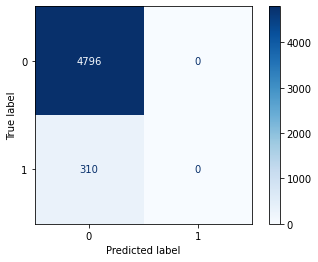

(0.0, 1.0)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(SVM, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Support vector classifier SMOTE

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=14)
sm= SMOTE()
X_train_sm,y_train_sm = sm.fit_resample(X_train, y_train)

In [ ]:
#smote
SVM2 = SVC(kernel = 'linear')
SVM2 = SVM2.fit(X_train_sm,y_train_sm)
y_predicted = SVM2.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.7027027027027027
Mean Squared Error: 0.2972972972972973
R²: -4.08
              precision    recall  f1-score   support

           0       0.95      0.72      0.82      4787
           1       0.10      0.48      0.17       319

    accuracy                           0.70      5106
   macro avg       0.53      0.60      0.49      5106
weighted avg       0.90      0.70      0.78      5106

BCR: 0.6000590680218696


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


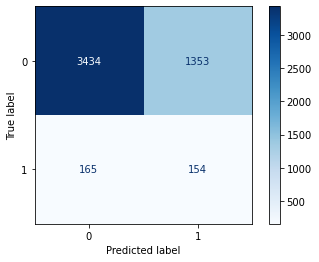

(0.4827586206896552, 0.7173595153540839)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(SVM2, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Support vector classifier RUS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=15)
rus= RandomUnderSampler()
X_train_rus,y_train_rus = rus.fit_resample(X_train, y_train)

In [ ]:
#rus
SVM3 = SVC(kernel = 'linear')
SVM3 = SVM3.fit(X_train_rus,y_train_rus)
y_predicted = SVM3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.5569917743830788
Mean Squared Error: 0.44300822561692127
R²: -6.41
              precision    recall  f1-score   support

           0       0.95      0.55      0.70      4780
           1       0.09      0.61      0.15       326

    accuracy                           0.56      5106
   macro avg       0.52      0.58      0.43      5106
weighted avg       0.90      0.56      0.67      5106

BCR: 0.5833175039145725


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


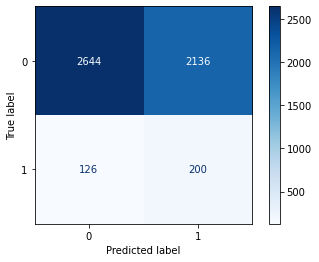

(0.6134969325153374, 0.5531380753138075)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(SVM3, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Support vector classifier ROS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=16)
ros= RandomOverSampler()
X_train_ros,y_train_ros = ros.fit_resample(X_train, y_train)

In [ ]:
#ros
SVM4 = SVC(kernel = 'linear')
SVM4 = SVM4.fit(X_train_ros,y_train_ros)
y_predicted = SVM4.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.6396396396396397
Mean Squared Error: 0.36036036036036034
R²: -5.30
              precision    recall  f1-score   support

           0       0.96      0.65      0.77      4795
           1       0.09      0.56      0.16       311

    accuracy                           0.64      5106
   macro avg       0.52      0.60      0.46      5106
weighted avg       0.90      0.64      0.73      5106

BCR: 0.6006585101710316


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


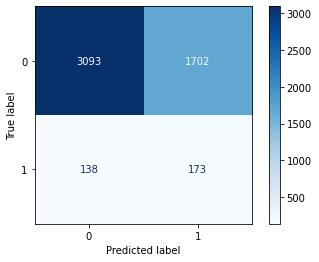

(0.5562700964630225, 0.6450469238790406)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(SVM4, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#### **Naive Bayes**

#####Naive Bayes base

In [ ]:
from sklearn.naive_bayes import ComplementNB

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=17)

In [ ]:
#base
NB = ComplementNB()
NB = NB.fit(X_train,y_train)
y_predicted = NB.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.8223658441049745
Mean Squared Error: 0.17763415589502546
R²: -2.05
              precision    recall  f1-score   support

           0       0.94      0.87      0.90      4789
           1       0.08      0.18      0.11       317

    accuracy                           0.82      5106
   macro avg       0.51      0.52      0.51      5106
weighted avg       0.89      0.82      0.85      5106

BCR: 0.5208818447638615


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


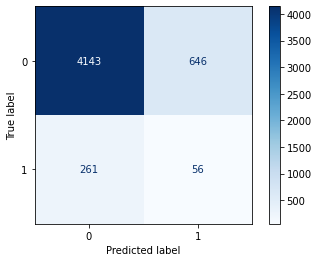

(0.17665615141955837, 0.8651075381081645)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(NB, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Naive Bayes SMOTE

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=18)
sm= SMOTE()
X_train_sm,y_train_sm = sm.fit_resample(X_train, y_train)

In [ ]:
#sm
NB2 = ComplementNB()
NB2 = NB2.fit(X_train_sm,y_train_sm)
y_predicted = NB2.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.24324324324324326
Mean Squared Error: 0.7567567567567568
R²: -12.03
              precision    recall  f1-score   support

           0       0.94      0.21      0.34      4790
           1       0.06      0.79      0.11       316

    accuracy                           0.24      5106
   macro avg       0.50      0.50      0.23      5106
weighted avg       0.88      0.24      0.33      5106

BCR: 0.4976407864485611


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


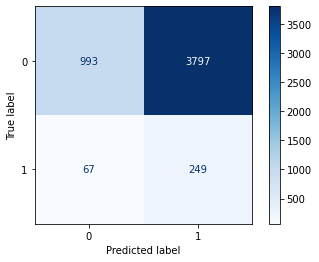

(0.7879746835443038, 0.20730688935281838)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(NB2, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Naive Bayes RUS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=19)
rus= RandomUnderSampler()
X_train_rus,y_train_rus = rus.fit_resample(X_train, y_train)

In [ ]:
#rus
NB3 = ComplementNB()
NB3 = NB3.fit(X_train_rus,y_train_rus)
y_predicted = NB3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.6799843321582452
Mean Squared Error: 0.3200156678417548
R²: -4.32
              precision    recall  f1-score   support

           0       0.94      0.70      0.80      4778
           1       0.08      0.38      0.13       328

    accuracy                           0.68      5106
   macro avg       0.51      0.54      0.47      5106
weighted avg       0.89      0.68      0.76      5106

BCR: 0.5393801876486743


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


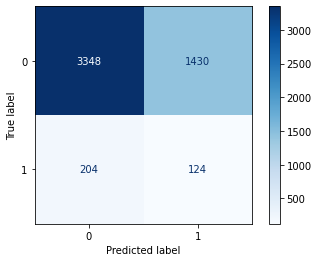

(0.3780487804878049, 0.7007115948095437)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(NB3, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####Naive Bayes ROS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=20)
ros= RandomOverSampler()
X_train_ros,y_train_ros = ros.fit_resample(X_train, y_train)

In [ ]:
#ros
NB4 = ComplementNB()
NB4 = NB4.fit(X_train_ros,y_train_ros)
y_predicted = NB3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.68174696435566
Mean Squared Error: 0.31825303564434
R²: -4.55
              precision    recall  f1-score   support

           0       0.94      0.70      0.81      4794
           1       0.07      0.34      0.12       312

    accuracy                           0.68      5106
   macro avg       0.51      0.52      0.46      5106
weighted avg       0.89      0.68      0.76      5106

BCR: 0.523372565065306


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


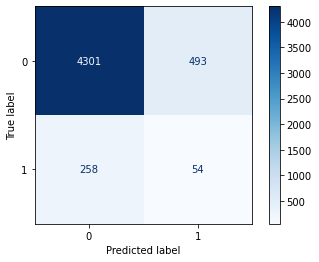

(0.34294871794871795, 0.703796412181894)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(NB4, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#### **Gradient Boosting Classfier**

#####GBC base

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=21)

In [ ]:
GBC = GradientBoostingClassifier(n_estimators=100)
GBC = GBC.fit(X_train,y_train)
y_predicted = GBC.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.9416372894633764
Mean Squared Error: 0.05836271053662358
R²: -0.01
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      4790
           1       0.62      0.15      0.24       316

    accuracy                           0.94      5106
   macro avg       0.78      0.57      0.61      5106
weighted avg       0.93      0.94      0.92      5106

BCR: 0.5728178430802568


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


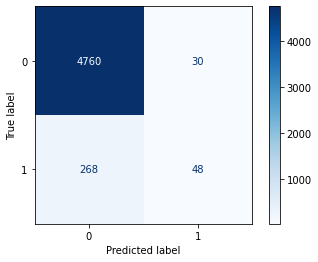

(0.1518987341772152, 0.9937369519832986)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(GBC, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####GBC SMOTE

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=22)
sm= SMOTE()
X_train_sm,y_train_sm = sm.fit_resample(X_train, y_train)

In [ ]:
#sm
GBC2 = GradientBoostingClassifier(n_estimators=100)
GBC2 = GBC2.fit(X_train_sm,y_train_sm)
y_predicted = GBC2.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.8916960438699569
Mean Squared Error: 0.10830395613004308
R²: -0.81
              precision    recall  f1-score   support

           0       0.97      0.92      0.94      4779
           1       0.30      0.53      0.39       327

    accuracy                           0.89      5106
   macro avg       0.63      0.72      0.66      5106
weighted avg       0.92      0.89      0.91      5106

BCR: 0.724205286507676


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


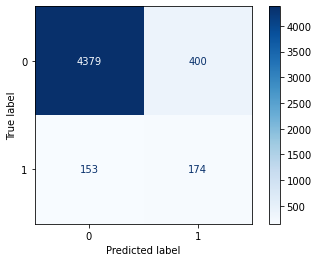

(0.5321100917431193, 0.9163004812722327)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(GBC2, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####GBC RUS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=23)
rus= RandomUnderSampler()
X_train_rus,y_train_rus = rus.fit_resample(X_train, y_train)

In [ ]:
#rus
GBC3 = GradientBoostingClassifier(n_estimators=100)
GBC3 = GBC3.fit(X_train_rus,y_train_rus)
y_predicted = GBC3.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.7287504896200548
Mean Squared Error: 0.27124951037994516
R²: -3.71
              precision    recall  f1-score   support

           0       0.98      0.72      0.83      4793
           1       0.16      0.80      0.27       313

    accuracy                           0.73      5106
   macro avg       0.57      0.76      0.55      5106
weighted avg       0.93      0.73      0.80      5106

BCR: 0.7629446963723054


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


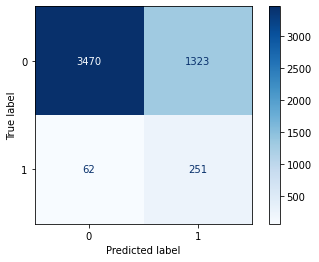

(0.8019169329073482, 0.7239724598372627)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(GBC3, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

#####GBC ROS

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.80, random_state=24)
ros= RandomOverSampler()
X_train_ros,y_train_ros = ros.fit_resample(X_train, y_train)

In [ ]:
#ros
GBC4 = GradientBoostingClassifier(n_estimators=100)
GBC4 = GBC4.fit(X_train_ros,y_train_ros)
y_predicted = GBC4.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_predicted))
print('R²: %.2f' % r2_score(y_test, y_predicted))
print(metrics.classification_report(y_test, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test, y_predicted))

Accuracy: 0.9063846455150802
Mean Squared Error: 0.0936153544849197
R²: -0.64
              precision    recall  f1-score   support

           0       0.97      0.93      0.95      4795
           1       0.34      0.55      0.42       311

    accuracy                           0.91      5106
   macro avg       0.65      0.74      0.68      5106
weighted avg       0.93      0.91      0.92      5106

BCR: 0.7381711254689873


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


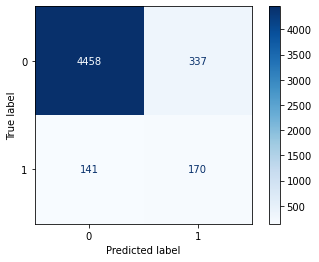

(0.5466237942122186, 0.929718456725756)

In [ ]:
#plot confusion matrix to understand
plot_confusion_matrix(GBC4, X_test, y_test, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

In [ ]:
GBC5 = GradientBoostingClassifier(n_estimators=100)
GBC5 = GBC5.fit(X_train_fold,y_train_fold)
y_predicted = GBC5.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.9482758620689655
Mean Squared Error: 0.05172413793103448
R²: 0.12
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      1196
           1       0.85      0.21      0.34        80

    accuracy                           0.95      1276
   macro avg       0.90      0.60      0.66      1276
weighted avg       0.94      0.95      0.93      1276

BCR: 0.6049958193979933


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


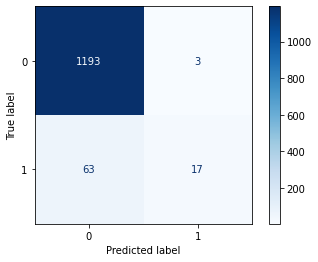

(0.2125, 0.9974916387959866)

In [ ]:
plot_confusion_matrix(GBC5, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

In [ ]:
GBC6 = GradientBoostingClassifier(n_estimators=100)
GBC6 = GBC6.fit(X_train_sm_fold,y_train_sm_fold)
y_predicted = GBC6.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.8847962382445141
Mean Squared Error: 0.1152037617554859
R²: -0.96
              precision    recall  f1-score   support

           0       0.98      0.90      0.94      1196
           1       0.31      0.68      0.42        80

    accuracy                           0.88      1276
   macro avg       0.64      0.79      0.68      1276
weighted avg       0.93      0.88      0.90      1276

BCR: 0.7869147157190636


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


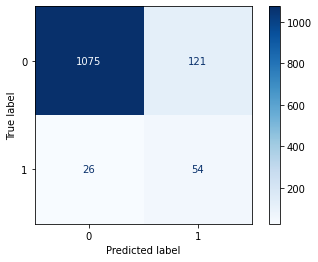

(0.675, 0.8988294314381271)

In [ ]:
plot_confusion_matrix(GBC6, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

In [ ]:
GBC7 = GradientBoostingClassifier(n_estimators=100)
GBC7 = GBC6.fit(X_train_rus_fold,y_train_rus_fold)
y_predicted = GBC7.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.8283699059561128
Mean Squared Error: 0.17163009404388715
R²: -1.92
              precision    recall  f1-score   support

           0       0.99      0.82      0.90      1196
           1       0.25      0.90      0.40        80

    accuracy                           0.83      1276
   macro avg       0.62      0.86      0.65      1276
weighted avg       0.95      0.83      0.87      1276

BCR: 0.8617892976588628


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


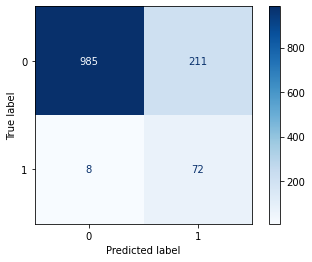

(0.9, 0.8235785953177257)

In [ ]:
plot_confusion_matrix(GBC7, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 

In [ ]:
GBC8 = GradientBoostingClassifier(n_estimators=100)
GBC8 = GBC8.fit(X_train_ros_fold,y_train_ros_fold)
y_predicted = GBC8.predict(X_test_fold)
print("Accuracy:",metrics.accuracy_score(y_test_fold, y_predicted))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_fold, y_predicted))
print('R²: %.2f' % r2_score(y_test_fold, y_predicted))
print(metrics.classification_report(y_test_fold, y_predicted, labels=np.unique(y_predicted)))
print("BCR:" , balanced_accuracy_score(y_test_fold, y_predicted))

Accuracy: 0.8800940438871473
Mean Squared Error: 0.11990595611285267
R²: -1.04
              precision    recall  f1-score   support

           0       0.99      0.88      0.93      1196
           1       0.33      0.89      0.48        80

    accuracy                           0.88      1276
   macro avg       0.66      0.88      0.71      1276
weighted avg       0.95      0.88      0.90      1276

BCR: 0.8835493311036788


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


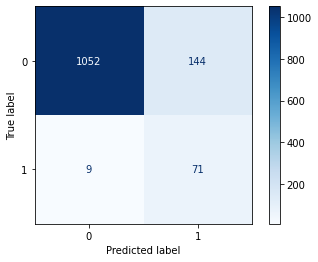

(0.8875, 0.8795986622073578)

In [ ]:
plot_confusion_matrix(GBC8, X_test_fold, y_test_fold, cmap=plt.cm.Blues)  
plt.show()
recall_sensitivity = metrics.recall_score(y_test_fold, y_predicted, pos_label=1)
recall_specificity = metrics.recall_score(y_test_fold, y_predicted, pos_label=0)
recall_sensitivity, recall_specificity 